In [1]:
'''
Date: 16/June/2022
Auther: Yike Xie
Content: Figure 2-1 in dengue paper
'''

'\nDate: 16/June/2022\nAuther: Yike Xie\nContent: Figure 2-1 in dengue paper\n'

In [2]:
import os

import numpy as np
import pandas as pd

#import anndata
import scanpy as sc

import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
from matplotlib import gridspec
import matplotlib as mpl
import seaborn as sns

from collections import defaultdict
import random
import itertools
from numpy import *    

In [3]:
import sys
sys.path.append('/home/yike/phd/dengue/dengue_children/paper_figures/final/modules') 
import YK_util, optimized_pair_comparison, functions_CCC_figure_fra_pair
from YK_util import *
from optimized_pair_comparison import *
from functions_CCC_figure_fra_pair import *

In [4]:
# load data
path = '/home/yike/phd/dengue/data/mergedata_luca_NKT_202206.h5ad'
adata = sc.read_h5ad(path)
adata_kid = subsetdata(adata)
adata_kid = normalizedata(adata_kid, log1p=True) # log1p = 2
adata_kid = removegenes(adata_kid)
adata_kid = adata_kid[(adata_kid.obs.cell_subtype_new != 'doublets') & 
                        (adata_kid.obs.cell_subtype_new != 'unknown')].copy()

sc.pp.filter_genes(adata_kid, min_cells=3)

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [5]:
#rename and reorder some celltypes 
adata_kid = adata_kid.copy()
reorg_data(adata_kid) # 'cell_type_new', 'cell_subtype_new'

adata_kid.obs.cell_type_new = adata_kid.obs.cell_type_new.astype('object')
adata_kid.obs.cell_subtype_new = adata_kid.obs.cell_subtype_new.astype('object')

/home/yike/phd/dengue/dengue_children/paper_figures/final/modules/YK_util.py:172: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['cell_type_new'].cat.reorder_categories(group_order_primary, inplace=True)
/home/yike/phd/dengue/dengue_children/paper_figures/final/modules/YK_util.py:204: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['cell_subtype_new'].cat.reorder_categories(group_order_secondary, inplace=True)


In [6]:
#save path
save_figures = '/home/yike/phd/dengue/docs/paper_draft/figures/figure_2/'
save_tables = '/home/yike/phd/dengue/docs/paper_draft/tabels/'

In [7]:
# get cell types and cell subtypes
cell_types = adata_kid.obs['cell_type_new'].unique().tolist()
cell_subtypes = adata_kid.obs['cell_subtype_new'].unique().tolist()

In [8]:
# load cell type palette
ct_palette = load_ct_palette()
print([ct for ct in ct_palette.keys()])
sns.color_palette(ct_palette.values())

['B cells', 'Plasmablasts', 'T cells', 'NK cells', 'Monocytes', 'conventional DCs', 'plasmacytoid DCs', 'megakaryocytes']


[(0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [9]:
# load cell subtype palette
cst_palette = load_cst_palette()
print([cst for cst in cst_palette.keys()])
sns.color_palette(cst_palette.values())

['memory B cells', 'naive B cells', 'activated B cells', 'proliferating plasmablasts', 'non-proliferating plasmablasts', 'CD4+ naive T cells', 'CD4+ memory T cells', 'CD8+ naive T cells', 'CD8+ effector memory T cells', 'CD8+ exhausted T cells', 'Tregs', 'MAIT', 'signaling NK cells', 'cytotoxic NK cells', 'proliferating NK cells', 'classical monocytes', 'non-classical monocytes', 'intermediate monocytes', 'cDC1', 'cDC2', 'pDCs', 'megakaryocytes']


[(1.0, 0.0, 0.0),
 (0.7372549019607844, 0.5607843137254902, 0.5607843137254902),
 (0.5019607843137255, 0.0, 0.0),
 (1.0, 0.8941176470588236, 0.7686274509803922),
 (1.0, 0.5490196078431373, 0.0),
 (0.6901960784313725, 0.7686274509803922, 0.8705882352941177),
 (0.4392156862745098, 0.5019607843137255, 0.5647058823529412),
 (0.0, 0.0, 0.5019607843137255),
 (0.2549019607843137, 0.4117647058823529, 0.8823529411764706),
 (0.0, 0.7490196078431373, 1.0),
 (0.0, 1.0, 1.0),
 (0.37254901960784315, 0.6196078431372549, 0.6274509803921569),
 (0.5019607843137255, 0.0, 0.5019607843137255),
 (0.8666666666666667, 0.6274509803921569, 0.8666666666666667),
 (1.0, 0.0, 1.0),
 (0.5607843137254902, 0.7372549019607844, 0.5607843137254902),
 (0.5647058823529412, 0.9333333333333333, 0.5647058823529412),
 (0.0, 0.5019607843137255, 0.0),
 (1.0, 0.7529411764705882, 0.796078431372549),
 (1.0, 0.0784313725490196, 0.5764705882352941),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [10]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

def info_df(adata, group):
    #initiate dataframe
    index = adata[adata.obs.Condition != 'Healthy'].obs.ID.unique()
    col = adata.obs[group].unique()
    df = pd.DataFrame(index=index, columns=col)
    df.loc[:,:] = 0 
    
    #count virus_harboring cells in each cell type
    adata_virus = adata[adata.obs.DENV_reads != 0]
    for ct in col:
        temp = adata_virus[adata_virus.obs[group] == ct].obs.ID.value_counts()
        df.loc[temp.index, ct] = temp
    df['cell_sum'] = df.sum(axis = 1)
        
    df.loc[adata.obs[adata.obs.Condition == 'DWS'].ID.unique(), 'Condition'] = 'DWS'
    df.loc[adata.obs[adata.obs.Condition == 'dengue'].ID.unique(), 'Condition'] = 'dengue'
    df.loc[adata.obs[adata.obs.Condition == 'S_dengue'].ID.unique(), 'Condition'] = 'S_dengue'
    
#     df.drop(columns = ['unhealthy_cells', 'Platelets'],inplace=True)
    
    return(df)

def stackplot(df, group, path, name):
    rcParams['figure.figsize']=(6, 6)
    rcParams['font.size']= 16
    rcParams['axes.titlesize'] = 20
    rcParams['axes.labelsize'] = 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    
    df['Condition'] = df['Condition'].astype('category')
    df['Condition'].cat.set_categories(['S_dengue', 'dengue', 'DWS'], inplace=True)
    df = df.sort_values(by = ['Condition','cell_sum'], ascending = False)
    df = df.loc[df.cell_sum != 0]
    
    df_temp = df.drop(columns = ['cell_sum', 'Condition'])
    fig, ax = plt.subplots()
    
    cmap = [ct_palette, cst_palette][group != 'cell_type_new']
    palette = ListedColormap([cmap[ct] for ct in df_temp.columns])
    
    df_temp.plot(kind='bar', stacked=True, ax=ax, colormap=palette)
    ax.legend(bbox_to_anchor=([1.65, 1][group != 'cell_type_new'], 1))
    
    #ax.set_xlabel('Sample')
    ax.set_ylabel('Cell number')
    ax.set_title('DENV harboring cells')
    ax.tick_params(axis = 'x', rotation = 90)
    ax.tick_params(axis = 'y')
    xlabels = [x.get_text()[:5] for x in ax.get_xticklabels()]
    ax.set_xticklabels(xlabels)
    
    filename = os.path.join(path, name)
    fig.savefig(filename, bbox_inches = 'tight')
    
def df_info_process(df, adata, group):
    df_temp = df.loc[(df.Condition == 'DWS') & (df.cell_sum > 100), :].iloc[:,:-2]
    df_temp.columns = df_temp.columns.astype('object')
    df_temp.index = df_temp.index.astype('object')
    
    df_total_temp = pd.DataFrame(index = (df_temp.index + '-total'), columns = df_temp.columns)
    for ID in df_total_temp.index:
        for cell_type in df_total_temp.columns:
            df_total_temp.loc[ID, cell_type] = len(adata.obs.loc[(adata.obs.ID == ID.split('-')[0]) & 
                                                            (adata.obs[group] == cell_type)].index)
            
    
    df_temp = df_temp.T
    df_temp['top3_sum'] = df_temp.sum(axis = 1)
    df_total_temp = df_total_temp.T
    df_total_temp['top3_sum-total'] = df_total_temp.sum(axis = 1)
    
    df_merge = pd.concat([df_temp, df_total_temp], axis = 1)
    
    df_merge.loc[:, 'ratio'] = (df_merge.loc[:, 'top3_sum'] / df_merge.loc[:, 'top3_sum-total'])*100
    for ind in df_merge.index:
        df_merge.loc[ind, 'text'] = '{}/{}'.format(df_merge.loc[ind, 'top3_sum'].astype('int'), 
                                                   df_merge.loc[ind, 'top3_sum-total'].astype('int'))
    df_merge.loc[:, 'celltype'] = df_merge.index
    df_merge = df_merge.sort_values(by = 'top3_sum', ascending = False)
    
#     df_ratio = df_temp / df_total_temp
    
    return(df_merge)

def fraction_violin(df_merge, adata, group, path, filetype=False):
    
    order = df_merge.sort_values('ratio', ascending=False).index.tolist()
    order.remove('megakaryocytes')
    
    rcParams['figure.figsize']=(8, 1 + 0.7 * len(order))
    rcParams['font.size']= 22
    rcParams['axes.titlesize'] = 20
    rcParams['axes.labelsize'] = 22
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300  

    #####################################################
    def fraction_plotting(df_merge, group, ax):
        #Plotting for cell fraction

        cmap = [ct_palette, cst_palette][group != 'cell_type_new']
        palette = sns.color_palette([cmap[ct] for ct in order])
        df_merge = df_merge.loc[order]
        
        #fig, ax = plt.subplots()
        sns.barplot(data=df_merge, x='ratio', y='celltype', ax=ax, 
                    palette=palette)

        n = 0
        celltype = list(df_merge.index)
        for p in ax.patches:
            _x = p.get_x() + p.get_width() + float(0.3)
            _y = p.get_y() + p.get_height() / 2
            value = df_merge.loc[celltype[n], 'text']
            ax.text(_x, _y, value, ha="left")
            n = n + 1

        ax.set_xlim(0,70)
        ax.set_ylabel(None)
        ax.set_xlabel('% cells with DENV RNA')
        ax.set_title('')

        ax.tick_params(labelsize = 20, axis = 'x')
        ax.tick_params(labelsize = 20, axis = 'y')


    def viral_violin(adata, df_merge, group, ax):   

        adata.obs['DENV/million reads'] = np.log2(adata.obs['DENV_reads'] / adata.obs['n_counts'] * 1e6 + 1)
        df = adata[adata.obs[group] != 'megakaryocytes'].obs[[group, 'DENV/million reads']]

        df2 = df[df['DENV/million reads'] != 0]
        for ct in cell_types:
            df2 = pd.concat([df2, df[df[group] == ct].sort_values('DENV/million reads').head(20)])


        cmap = [ct_palette, cst_palette][group != 'cell_type_new']
        palette = sns.color_palette([cmap[ct] for ct in order])
        #fig, ax = plt.subplots()
        sns.violinplot(data=df, y=group, x='DENV/million reads', 
                       order=order, ax=ax, show=False,
                       palette=palette, 
                       rotation=90, xlabel='', bw=0.3, scale='width', 
                       inner=None, orient='h', linewidth=0.8, saturation=0.5)

        sns.swarmplot(data=df2, y=group, x='DENV/million reads', 
                     order=order, ax=ax, 
                     palette=palette, size=3, orient='h')  

        ax.set_yticklabels([])

        ax.set_xlim(-0.2, 20)
        ax.set_xticks([0, np.log2(100), np.log2(1e4), np.log2(1e6)])
        ax.set_xticklabels(['0', '$10^2$', '$10^4$', '$10^6$'])
        ax.set_xlabel('DENV/million reads')
        ax.set_ylabel(None)

    #####################################################    
    fig = plt.figure()
    grid = plt.GridSpec(1, 5, wspace=0.1, hspace=0.1)

    axs = []
    axs.append(plt.subplot(grid[0:1, 0: 3]))
    axs.append(plt.subplot(grid[0:1, 3: 5]))

    fraction_plotting(df_merge, group, ax=axs[0])
    viral_violin(adata, df_merge, group, ax=axs[1])

    if filetype is not False:
        name = group + 'fraction_violin' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')
        
def plot_viral_load_reads(df, file_name):    
    ###### rcParams['figure.figsize']=(6,6)
    rcParams['font.size']=18
    rcParams['pdf.fonttype'] = 42
    rcParams['font.sans-serif'] = "Arial"
    rcParams['figure.dpi'] = 300

    fig, ax = plt.subplots(figsize=[6, 6])
    cmap=sns.color_palette('Set2', 4)
    sns.scatterplot(data=df[df['Condition'] == 'Healthy'], x='Viral load (qPCR)', y='DENV reads',
                color=cmap[0], s=350, ax=ax, marker='s', alpha=0.8)

    sns.scatterplot(data=df[df['Condition'] != 'Healthy'], x='Viral load (qPCR)', y='DENV reads', 
                    hue='Condition', hue_order=['D', 'DWS',  'SD'],
                palette=[cmap[2], cmap[1], cmap[3]], s=200, ax=ax, alpha=0.8)

    ax.legend().remove()
    ax.set_xlabel('Viral load/copies per mL')

    ax.set_xlim(-1, 40)
    ax.set_xticks([0, np.log2(1e4), np.log2(1e8), np.log2(1e12)])
    ax.set_xticklabels(['0', '$10^4$', '$10^8$','$10^1$'+'$^2$'])

    ax.set_ylim(-0.2, 7)
    ax.set_yticks([0, np.log2(10), np.log2(100)])
    ax.set_yticklabels(['0', '10', '$10^2$'])
    ax.set_ylabel('DENV/million reads')

    handles = []
    handles.append(ax.scatter([], [], marker='s', s=350, color=cmap[0], alpha=0.8))
    for label, color in zip([ 'D', 'DWS', 'SD'], [cmap[2], cmap[1], cmap[3]]):
        handles.append(ax.scatter([], [], s=200, color=color, alpha=0.8))
    ax.legend(handles=handles, labels=['Healthy', 'D', 'DWS', 'SD'], loc='upper left')


    # from adjustText import adjust_text

    # texts = [ax.text(xi, yi, name[:5]) 
    #          for xi, yi, name in zip(x.loc[top3]['viral_load_qpcr']-2, y.loc[top3]['DENV_reads'], top3)]
    # adjust_text(texts)

    for xi, yi, name in zip(x.loc[top3]['viral_load_qpcr']-2, y.loc[top3]['DENV_reads'], top3):
        ax.text(xi, yi, name[:5], fontsize=16)

    ax.set_title('$\\rho = 0.789$\n$P = 2 × 10^{-5}$')
    # ax.set_title('$P = 2 \cdot 10^{-5}$')
    plt.savefig(save_figures + file_name)

In [11]:
adata_int = adata_kid[adata_kid.obs['cell_subtype_new'] == 'intermediate monocytes']
adata_nonint = adata_kid[adata_kid.obs['cell_subtype_new'].isin(['classical monocytes', 
                                                                 'non-classical monocytes'])    

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [23]:
log2fc = pd.read_csv('/home/yike/phd/dengue/docs/paper_draft/tabels/cst_log2FC.tsv', sep='\t', index_col=0)

In [25]:
log2fc = log2fc.set_index('index')

In [38]:
from scipy.stats import ks_2samp

stats = []
p = []
# intermediate monocytes vs classical monocytes
genes = ['VCAN', 'CD63', 'SELL', 'ITGB2', 'ITGAM', 'CD99']
for gene in genes:
    res = ks_2samp(log2fc.loc['intermediate monocytes'][gene], log2fc.loc['classical monocytes'][gene])
    stats.append(res[0])
    p.append(res[1])
    
df = pd.DataFrame([], index=genes)
df['statistic'] = stats
df['pvalue'] = p

In [42]:
from statsmodels.stats.multitest import multipletests
adjust_pvalue = multipletests(df['pvalue'], alpha=0.05, method='fdr_bh')[1]
df['adj_pvalue'] = adjust_pvalue
df

,statistic,pvalue,adj_pvalue
VCAN,0.321429,6.741581e-03,0.010112
CD63,0.326531,5.620118e-03,0.010112
SELL,0.173469,3.636953e-01,0.363695
ITGB2,0.191327,2.560947e-01,0.307314
ITGAM,0.408163,2.023526e-04,0.000607
CD99,0.510204,9.779032e-07,0.000006


In [40]:
stats = []
p = []
# intermediate monocytes vs classical monocytes
genes = ['VCAN', 'CD63', 'SELL', 'ITGB2', 'ITGAM', 'CD99']
for gene in genes:
    res = ks_2samp(log2fc.loc['intermediate monocytes'][gene], log2fc.loc['non-classical monocytes'][gene])
    stats.append(res[0])
    p.append(res[1])
    
df2 = pd.DataFrame([], index=genes)
df2['statistic'] = stats
df2['pvalue'] = p

In [43]:
adjust_pvalue = multipletests(df2['pvalue'], alpha=0.05, method='fdr_bh')[1]
df2['adj_pvalue'] = adjust_pvalue
df2

,statistic,pvalue,adj_pvalue
VCAN,0.380952,3.263329e-03,3.915995e-03
CD63,0.418367,8.283276e-04,1.242491e-03
SELL,0.434807,4.599978e-04,9.199957e-04
ITGB2,0.225624,2.002205e-01,2.002205e-01
ITGAM,0.556689,1.714386e-06,5.143159e-06
CD99,0.664399,3.014173e-09,1.808504e-08


In [44]:
2.002205e-01

0.2002205

In [45]:
9.199957e-04

0.0009199957

In [13]:
# figure 2A

viral_loads = adata_kid.obs[['viral_load_qpcr', 'ID']].groupby('ID').mean()['viral_load_qpcr']
x = np.log2(viral_loads + 1).to_frame()
x.columns = ['viral_load_qpcr']

DENV_reads = adata_kid.obs[['DENV_reads', 'ID']].groupby('ID').sum()['DENV_reads'] / adata_kid.obs[['n_counts', 'ID']].groupby('ID').sum()['n_counts'] * 1e6
y = np.log2( DENV_reads + 1).to_frame()
y.columns = ['DENV_reads']
#y = adata_kid.obs[['DENV_reads', 'ID']].groupby('ID').sum() +1
top3 = y.sort_values('DENV_reads')[-3:].index.tolist()

df = pd.DataFrame(index=x.index)
df['Viral load (qPCR)'] = x.loc[df.index]
df['DENV reads'] = y.loc[df.index]
df['Condition'] = [adata_kid[adata_kid.obs['ID'] == ID].obs['Condition'][0] for ID in df.index]
df['Condition'].replace({
    'S_dengue': 'SD',
    'dengue': 'D'
}, inplace=True)

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [144]:
from scipy.stats import spearmanr
spearmanr(df['Viral load (qPCR)'], df['DENV reads'])

SpearmanrResult(correlation=0.7569119110458075, pvalue=1.8610438585413457e-05)

In [145]:
df_H = df[df['Condition'] != 'Healthy']
spearmanr(df_H['Viral load (qPCR)'], df_H['DENV reads'])

SpearmanrResult(correlation=0.754427137199817, pvalue=0.00012141462284817546)

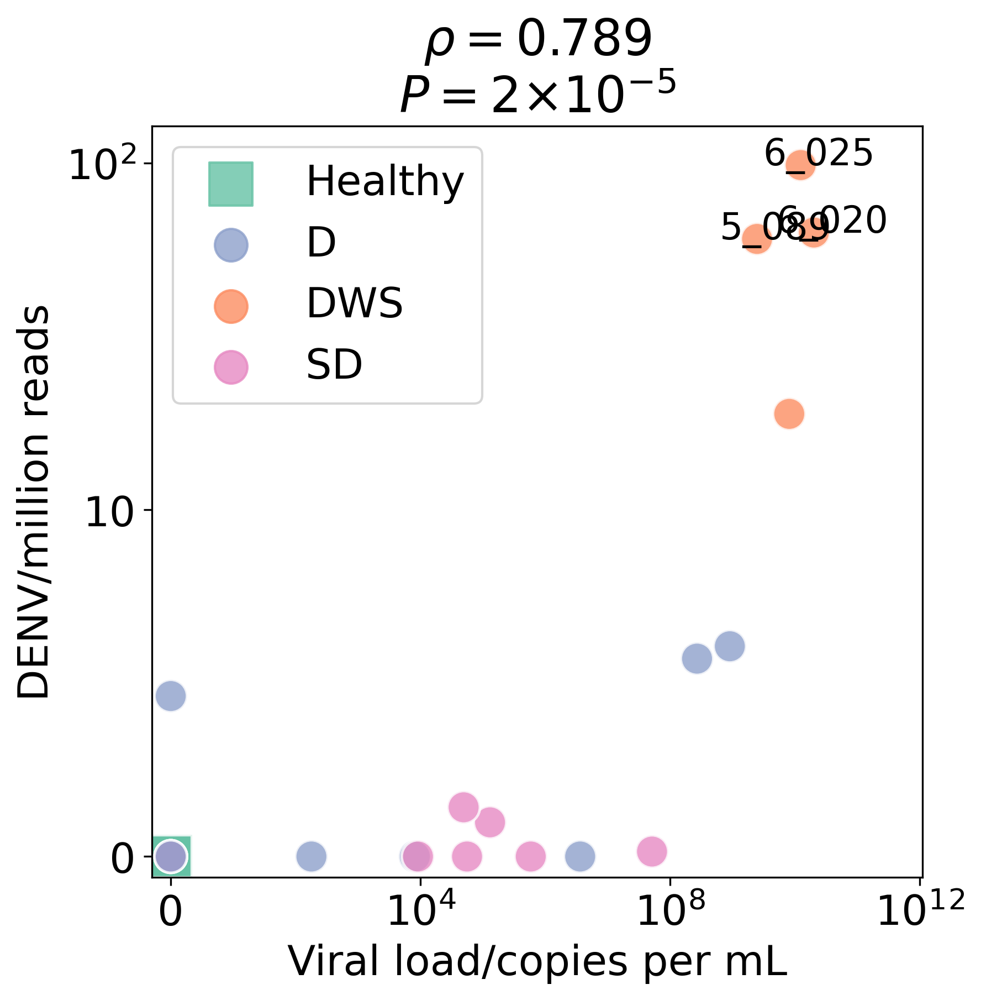

In [23]:
plot_viral_load_reads(df, 'DENV_molecules_vs_viral_load.pdf')

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2747: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2747:

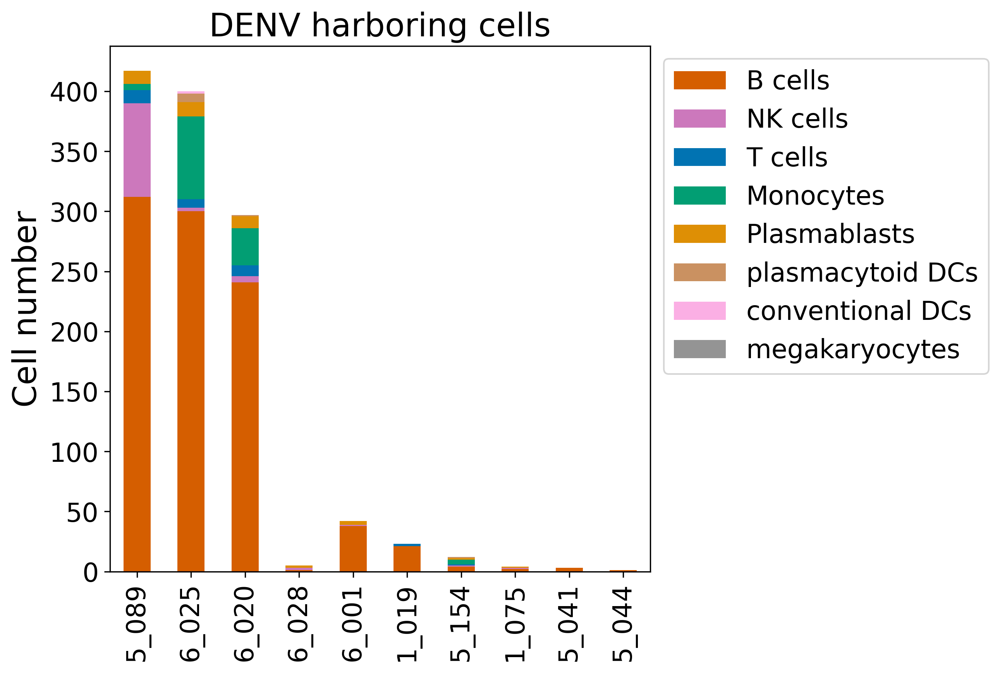

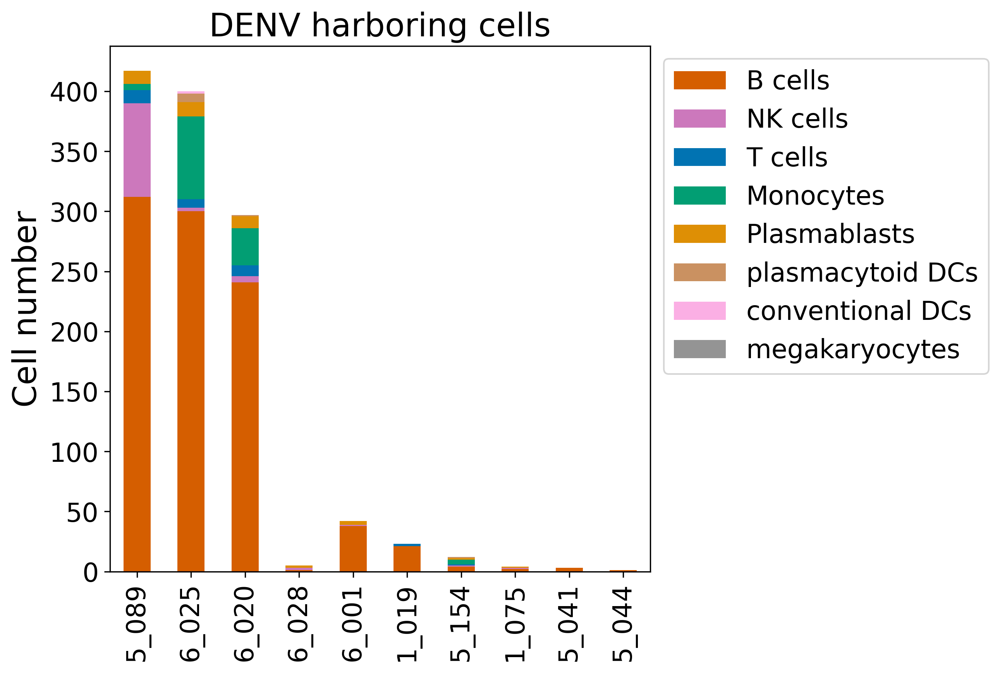

In [12]:
#calculating the numbers of VHC in each cell type and plot, Supplementary
df_info = info_df(adata_kid, 'cell_type_new')

name_1 = 'stackbar.png'
name_2 = 'stackbar.pdf'
stackplot(df_info, 'cell_type_new', save_figures, name_1)
stackplot(df_info, 'cell_type_new', save_figures, name_2)

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2747: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2747:

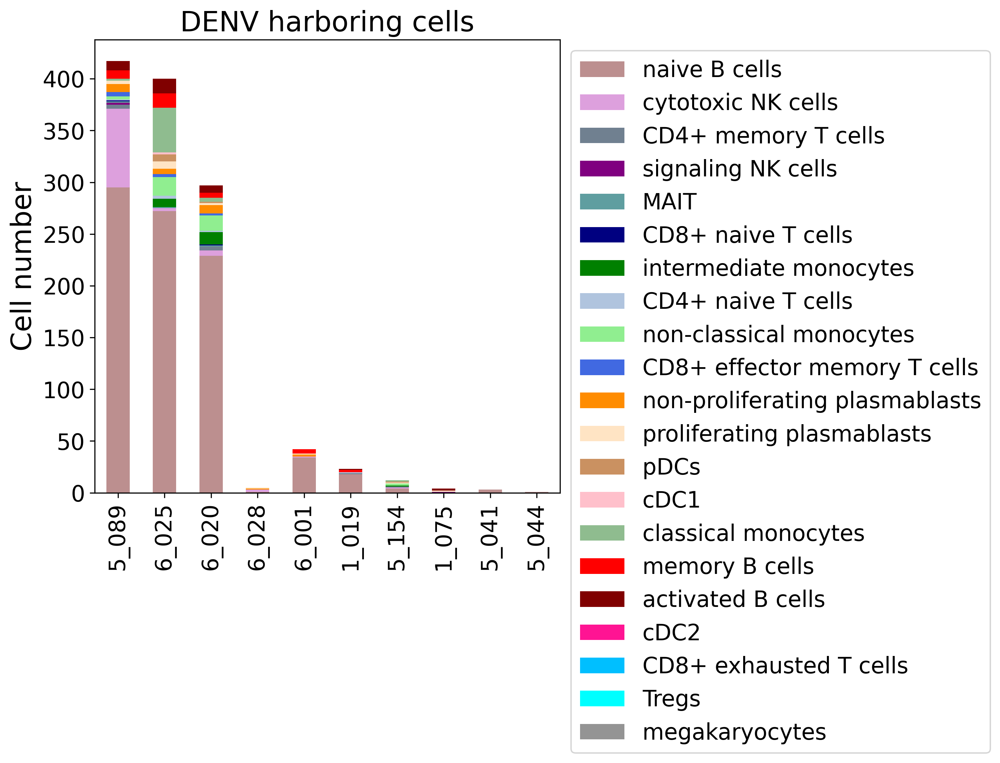

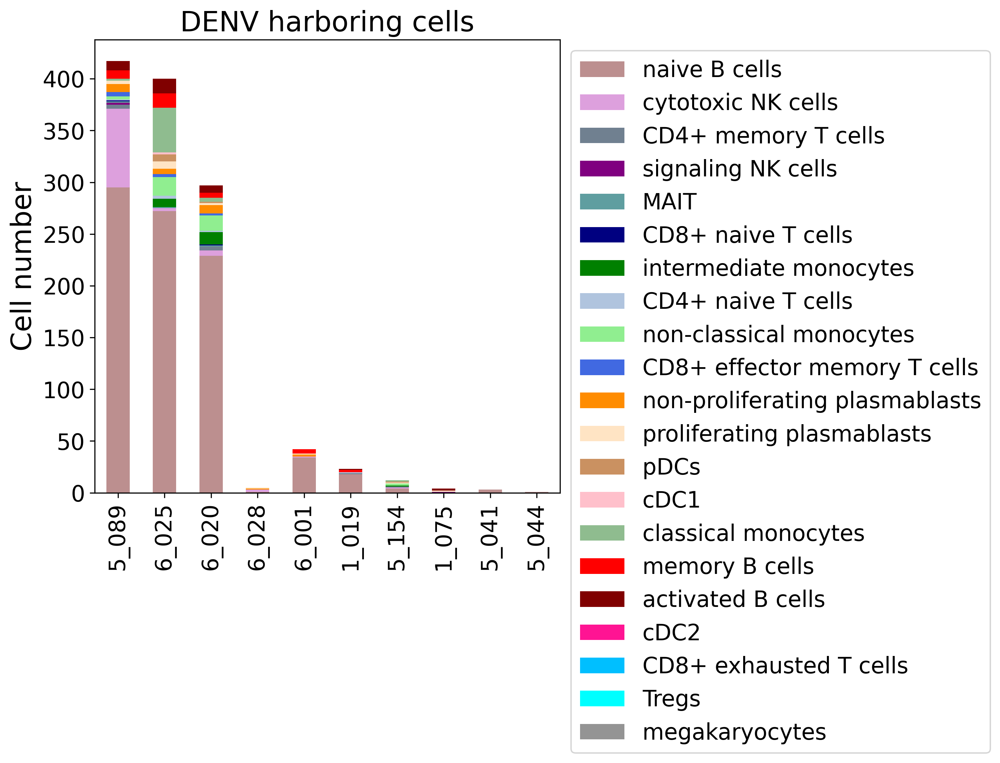

In [13]:
df_cst_info = info_df(adata_kid, 'cell_subtype_new')

name_1 = 'stackbar_cst.png'
name_2 = 'stackbar_cst.pdf'
stackplot(df_cst_info, 'cell_subtype_new', save_figures, name_1)
stackplot(df_cst_info, 'cell_subtype_new', save_figures, name_2)

In [15]:
ind = np.in1d(adata_kid.obs.ID, ['5_089_01', '6_025_01', '6_020_01'])
adata_kid_DWS = adata_kid[ind]
#adata_DENV = adata_kid_DWS[adata_kid_DWS.obs['DENV_reads'] > 0]

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
Trying to set attribute `.obs` of view, copying.
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 79.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 17.0% of the points cannot be placed; you 

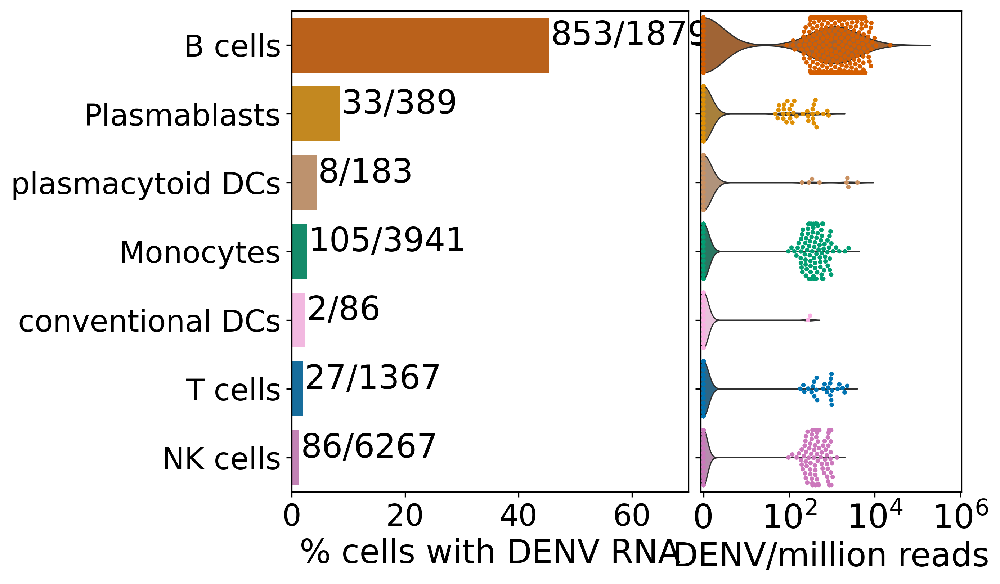

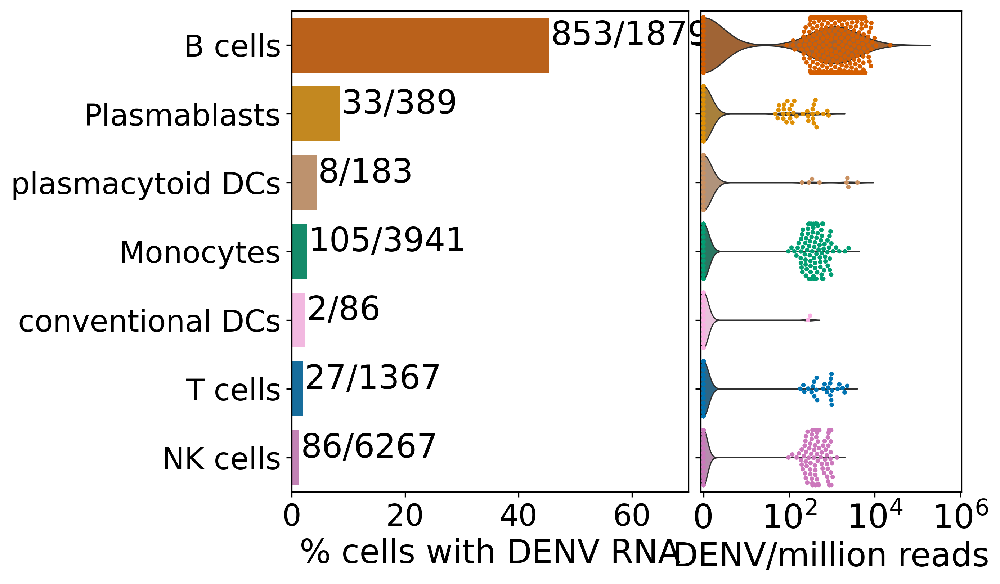

In [16]:
#For the VHC ratio panel in Figure 2B

#calculate the ratio and generate the table
df_info = info_df(adata_kid, 'cell_type_new')
df_merge = df_info_process(df_info, adata_kid, 'cell_type_new')

#plotting
fraction_violin(df_merge, adata_kid_DWS, 'cell_type_new', save_figures, filetype='.pdf')
fraction_violin(df_merge, adata_kid_DWS, 'cell_type_new', save_figures, filetype='.png')

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 81.3% of the points cannot be placed; you may

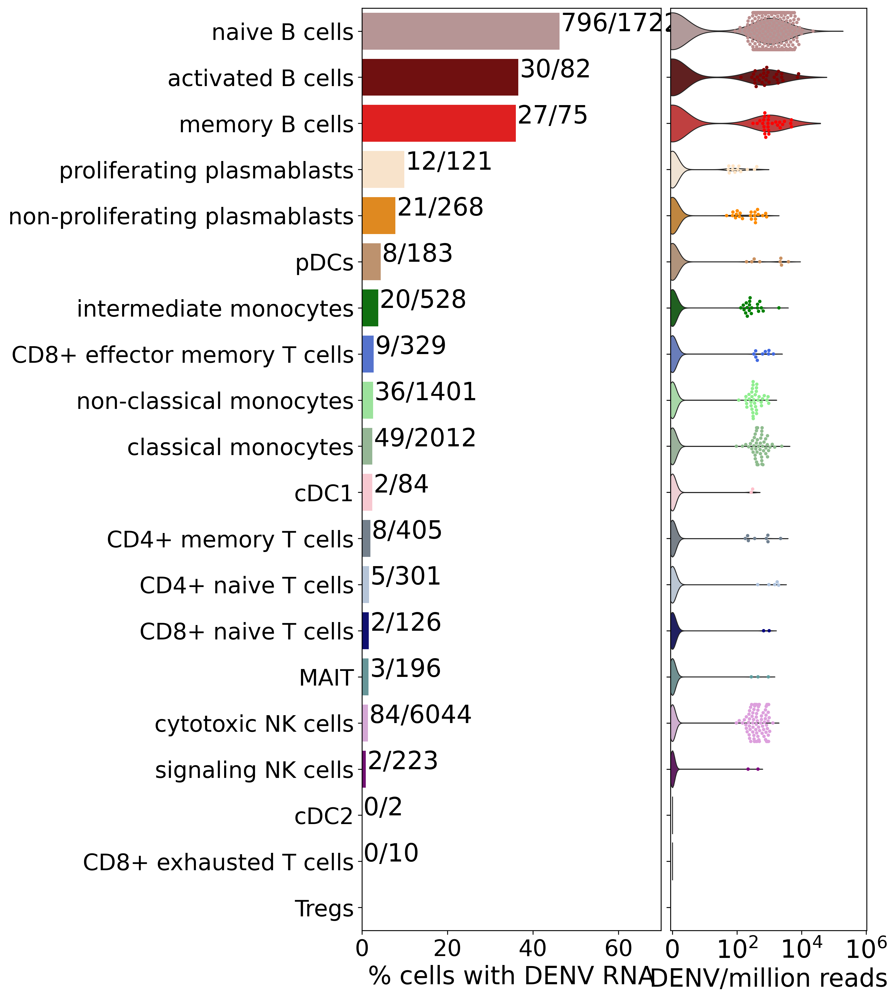

posx and posy should be finite values
posx and posy should be finite values


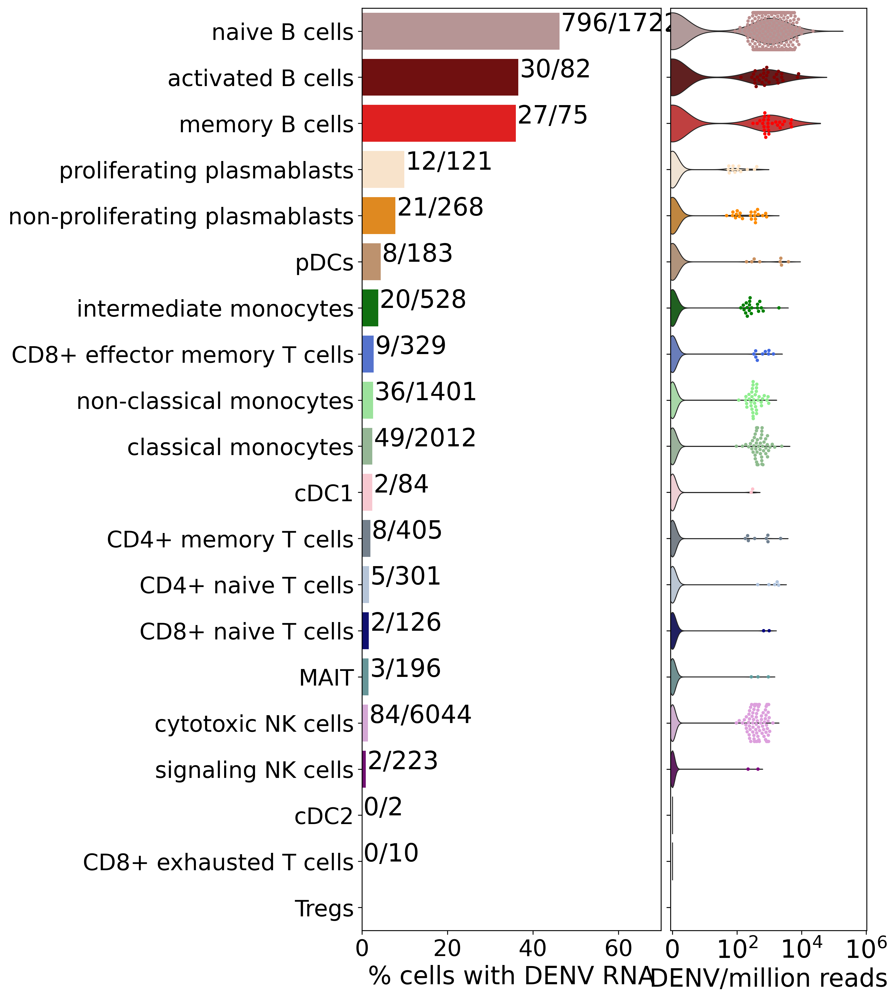

In [17]:
#For the VHC ratio panel in Figure 2B

#calculate the ratio and generate the table
df_cst_info = info_df(adata_kid, 'cell_subtype_new')
df_cst_merge = df_info_process(df_cst_info, adata_kid, 'cell_subtype_new')

#plotting
fraction_violin(df_cst_merge, adata_kid_DWS, 'cell_subtype_new', save_figures, filetype='.pdf')
fraction_violin(df_cst_merge, adata_kid_DWS, 'cell_subtype_new', save_figures, filetype='.png')


/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categor

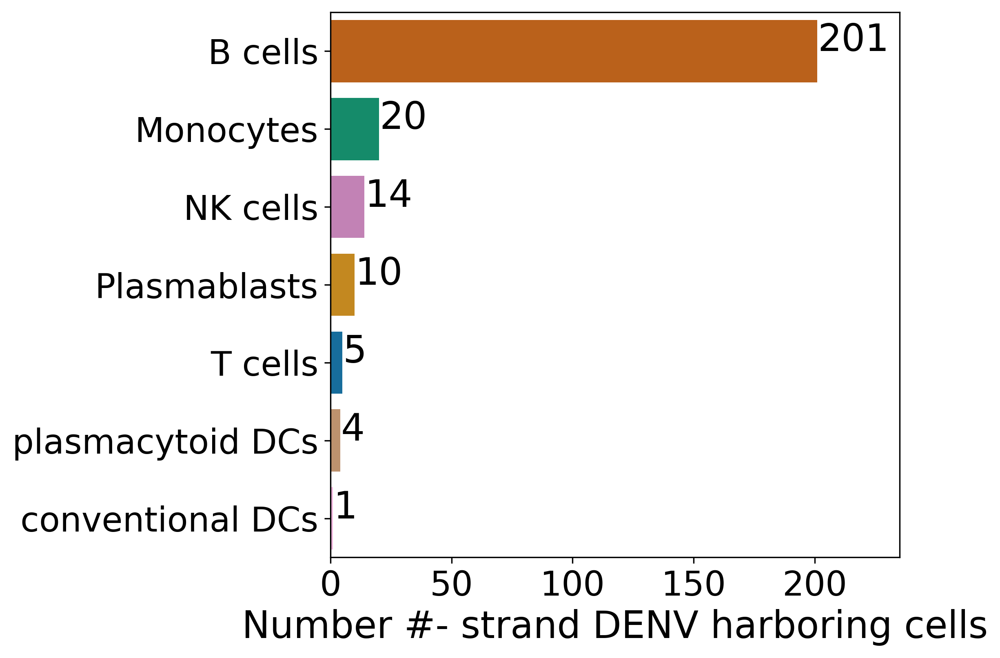

In [19]:
#For the number of - strand DENV harboring cells in supplementary
if False:
    n = []
    minus_cts = []
    for cell_type in cell_types:
        adata_ct = adata_kid[adata_kid.obs['cell_type_new'] == cell_type]
        ni = (adata_ct.obs['DENV_minus'].isin(['1.0', '2.0', '3.0', '4.0', '5.0', '9.0'])).sum()
        if ni == 0:
            continue
        n.append(ni)
        minus_cts.append(cell_type)

    df = pd.DataFrame(n, index=minus_cts, columns=['Number of DENV minus'])
    df['text'] = [str(i) + '/' + str(df['Number of DENV minus'].sum()) for i in df['Number of DENV minus']]
    df['cell_type'] = df.index
    
    ###########################################
    order = df.sort_values('Number of DENV minus', ascending=False).index.tolist()

    rcParams['figure.figsize']=(6, 1 + 0.7 * len(order))
    rcParams['font.size']= 22
    rcParams['axes.titlesize'] = 20
    rcParams['axes.labelsize'] = 22
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300  

    #####################################################
    group = 'cell_type_new'
    cmap = [ct_palette, cst_palette][group != 'cell_type_new']
    palette = sns.color_palette([cmap[ct] for ct in order])
    df = df.loc[order]

    fig, ax = plt.subplots()
    sns.barplot(data=df, x='Number of DENV minus', y='cell_type', ax=ax, 
            palette=palette)

    n = 0
    celltype = list(df['cell_type'])
    for p in ax.patches:
        _x = p.get_x() + p.get_width() + float(0.3)
        _y = p.get_y() + p.get_height() / 2
        value = df.loc[celltype[n], 'Number of DENV minus']
        ax.text(_x, _y, value, ha="left")
        n = n + 1

    ax.set_xlim(0,235)
    ax.set_ylabel(None)
    ax.set_xlabel('Number #- strand DENV harboring cells')
    ax.set_title('')

    ax.tick_params(labelsize = 20, axis = 'x')
    ax.tick_params(labelsize = 20, axis = 'y')

    fig.savefig(save_figures + 'n_minus_DENV.pdf')
    fig.savefig(save_figures + 'n_minus_DENV.png')

In [137]:
def virus_cum(cell_types, adata, group, path, name=False): 
    rcParams['figure.figsize']=(6, 5.9)
    rcParams['font.size']= 22
    rcParams['axes.titlesize'] = 20
    rcParams['axes.labelsize'] = 22
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300  
    
    fig, ax = plt.subplots()

    palette = [ct_palette, cst_palette][group != 'cell_type_new']
    for cell_type in cell_types:
        adata_ct = adata[adata.obs[group] == cell_type]

        x = list(np.sort(np.log2(adata_ct.obs['DENV_reads'] / adata_ct.obs['n_counts'] * 10e6 + 1)))
        y = list(1.0 - np.linspace(0, 1, len(x)))

        x = [0] + x
        y = [1] + y

        ax.plot(x, y, lw=4, color=palette[cell_type], label=cell_type)
        ax.legend(bbox_to_anchor=(1, 1))
        ax.set_xlim(6.5, 20)
        ax.set_xticks([np.log2(100), np.log2(1e4), np.log2(1e6)])
        ax.set_xticklabels(['$10^2$', '$10^4$', '$10^6$'])

        ax.grid(True)
        ax.set_xlabel('DENV/million reads within a cell')
        ax.set_ylabel('Cumulative over cells')
        
        if name is not False:
            fig.savefig(os.path.join(path, name), bbox_inches='tight')
            
def virus_kde(cell_types, adata, group, path, name=False):
    rcParams['figure.figsize']=(6, 5.9)
    rcParams['font.size']= 22
    rcParams['axes.titlesize'] = 20
    rcParams['axes.labelsize'] = 22
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300  
    
    fig, ax = plt.subplots()
    palette = [ct_palette, cst_palette][group != 'cell_type_new']
    
    for cell_type in cell_types:
        adata_ct = adata[adata.obs[group] == cell_type]

        x = list(np.sort(np.log2(adata_ct.obs['DENV_reads'] / adata_ct.obs['n_counts'] * 10e6 + 1)))
        sns.kdeplot(x, color=palette[cell_type], label=cell_type, lw=4)
        ax.legend(bbox_to_anchor=(1, 1))
        ax.set_xlim(6.5, 20)
        ax.set_xticks([np.log2(100), np.log2(1e4), np.log2(1e6)])
        ax.set_xticklabels(['$10^2$', '$10^4$', '$10^6$'])
        ax.grid(True)
        ax.set_xlabel('DENV/million reads within a cell')
        ax.set_ylabel('Density of cells')
        
        if name is not False:
            fig.savefig(os.path.join(path, name), bbox_inches='tight')

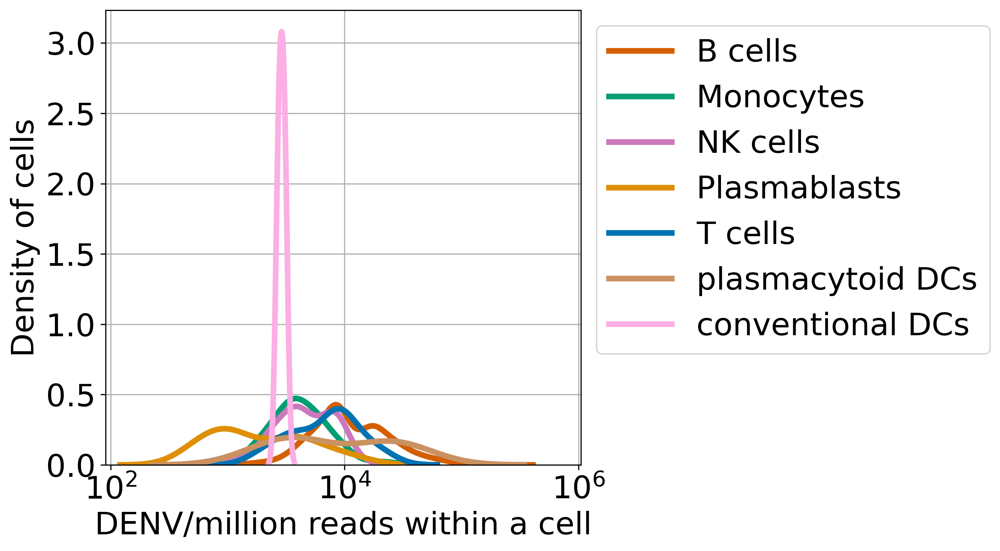

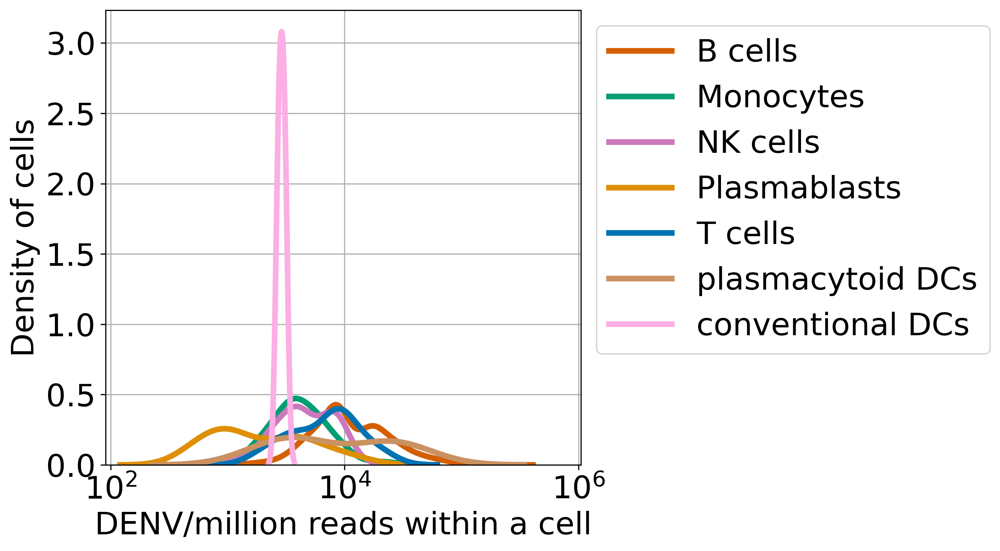

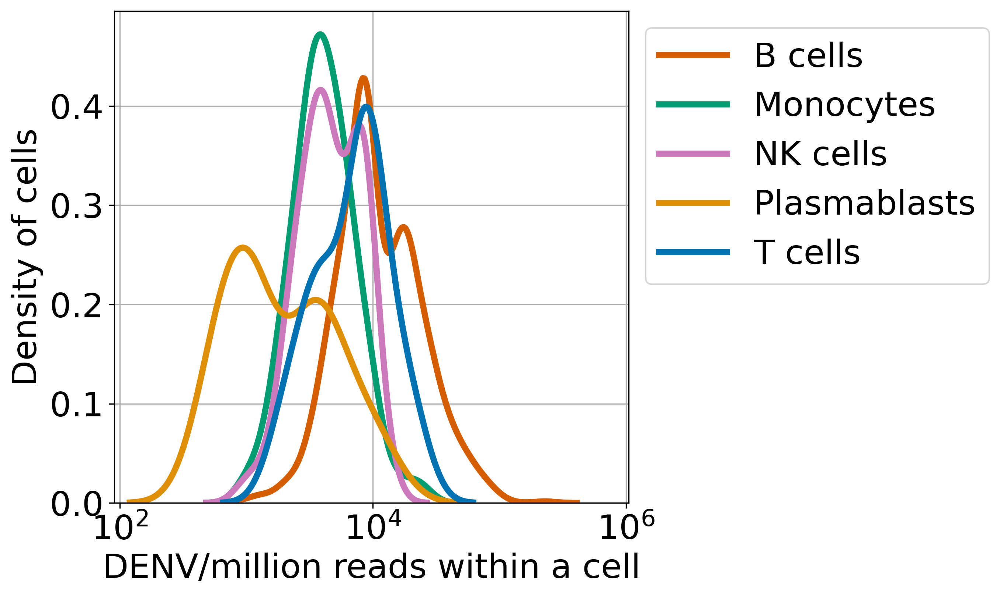

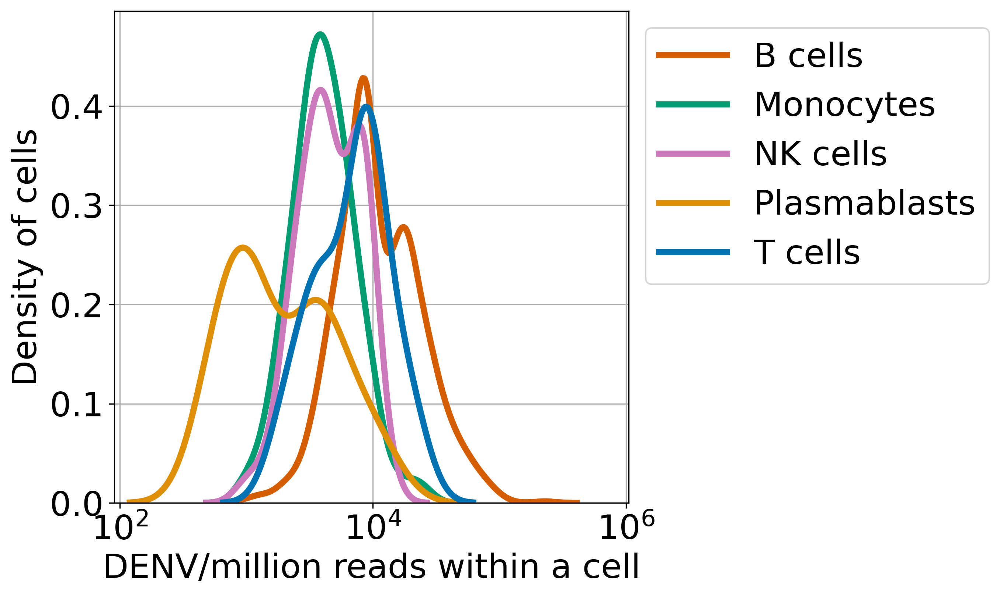

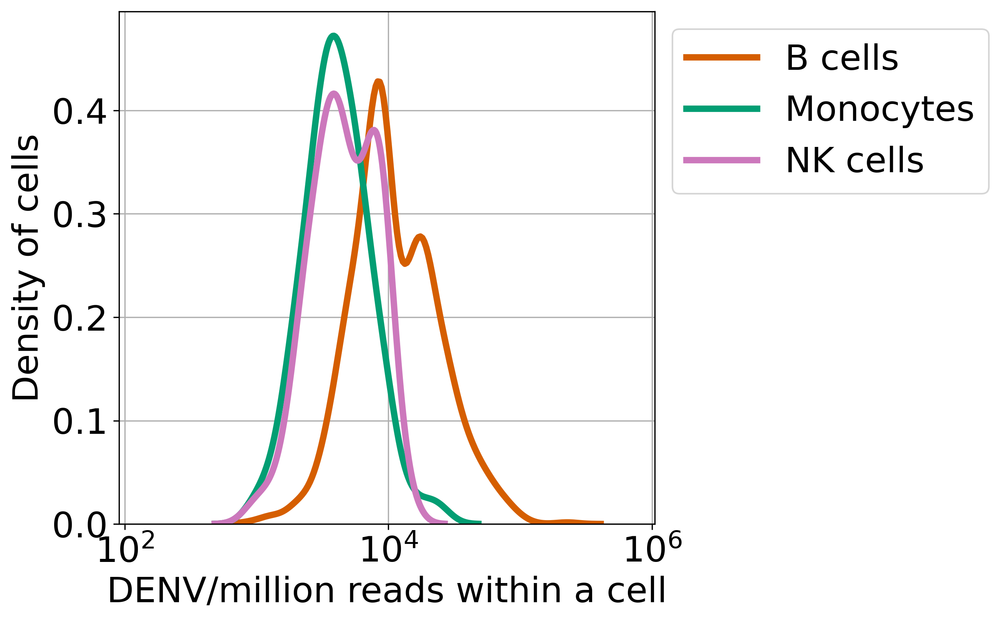

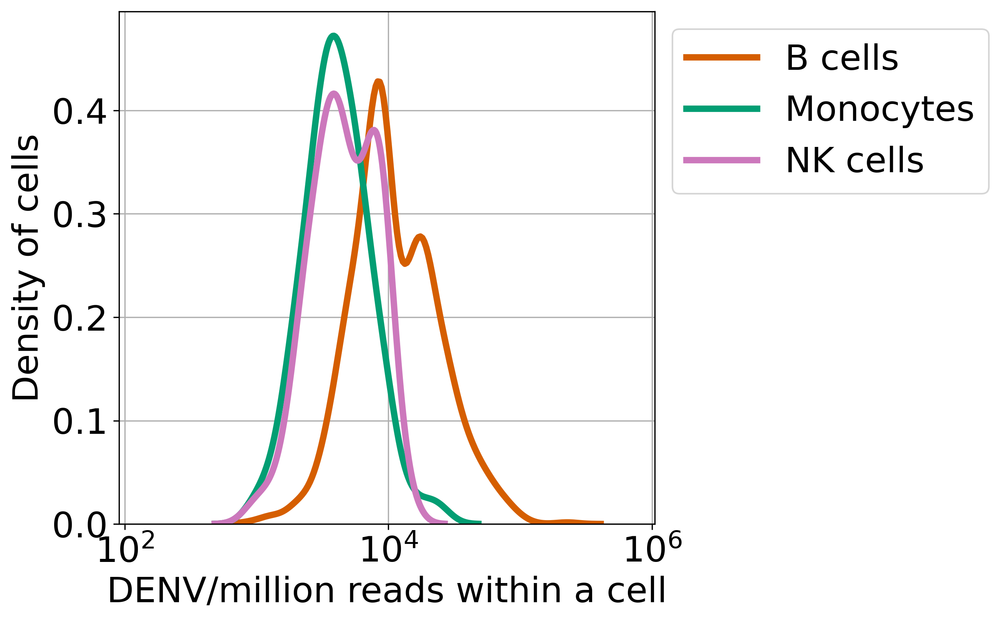

In [135]:
adata_virus = adata_kid[adata_kid.obs['DENV_reads'] != 0]
cts1 = ['B cells',
         'Monocytes',
         'NK cells',
         'Plasmablasts',
         'T cells',
         'plasmacytoid DCs',
         'conventional DCs'
                 ]
virus_cum(cts1, adata_virus, save_figures, name='cum1.pdf')   
virus_cum(cts1, adata_virus, save_figures, name='cum1.png')  

virus_kde(cts1, adata_virus, save_figures, name='kde1.pdf')   
virus_kde(cts1, adata_virus, save_figures, name='kde1.png')   

cts2 = ['B cells',
         'Monocytes',
         'NK cells',
         'Plasmablasts',
         'T cells',
                 ]
virus_cum(cts2, adata_virus, save_figures, name='cum2.pdf')   
virus_cum(cts2, adata_virus, save_figures, name='cum2.png')  

virus_kde(cts2, adata_virus, save_figures, name='kde2.pdf')   
virus_kde(cts2, adata_virus, save_figures, name='kde2.png')  

cts3 = ['B cells',
         'Monocytes',
         'NK cells',
                 ]
virus_cum(cts3, adata_virus, save_figures, name='cum3.pdf')   
virus_cum(cts3, adata_virus, save_figures, name='cum3.png') 

virus_kde(cts3, adata_virus, save_figures, name='kde3.pdf')   
virus_kde(cts3, adata_virus, save_figures, name='kde3.png')  


In [12]:
adata_virus = adata_kid[adata_kid.obs['DENV_reads'] != 0]

x_dic = {}
for cell_type in ['B cells', 'NK cells', 'Monocytes']:
        adata_ct = adata_virus[adata_virus.obs['cell_type_new'] == cell_type]

        x = list(np.sort(np.log2(adata_ct.obs['DENV_reads'] / adata_ct.obs['n_counts'] * 10e6 + 1)))
        x_dic[cell_type] = x

In [13]:
from scipy.stats import ks_2samp
ks_2samp(x_dic['B cells'], x_dic['Monocytes'])
# Bonferroni correcttion: 1.2725961982890777e-33

KstestResult(statistic=0.601419384337074, pvalue=4.241987327630259e-34)

In [14]:
ks_2samp(x_dic['B cells'], x_dic['NK cells'])
# Bonferroni correcttion: 2.53141911969137e-16

KstestResult(statistic=0.4576773241741776, pvalue=8.438063732304567e-17)

In [15]:
ks_2samp(x_dic['Monocytes'], x_dic['NK cells'-16-])
# Bonferroni correcttion: 0.3357785437109405

KstestResult(statistic=0.1646496193636541, pvalue=0.11192618123698017)

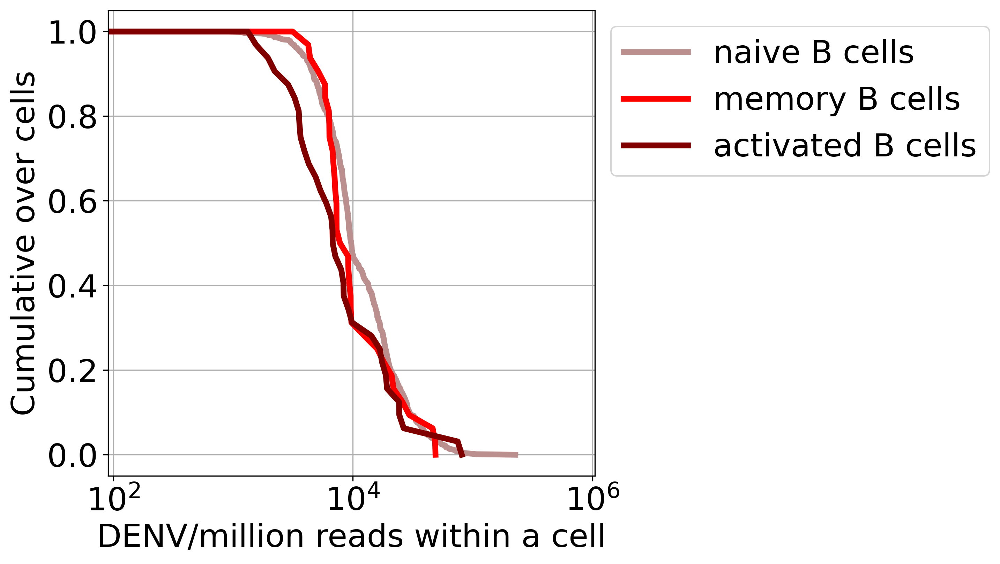

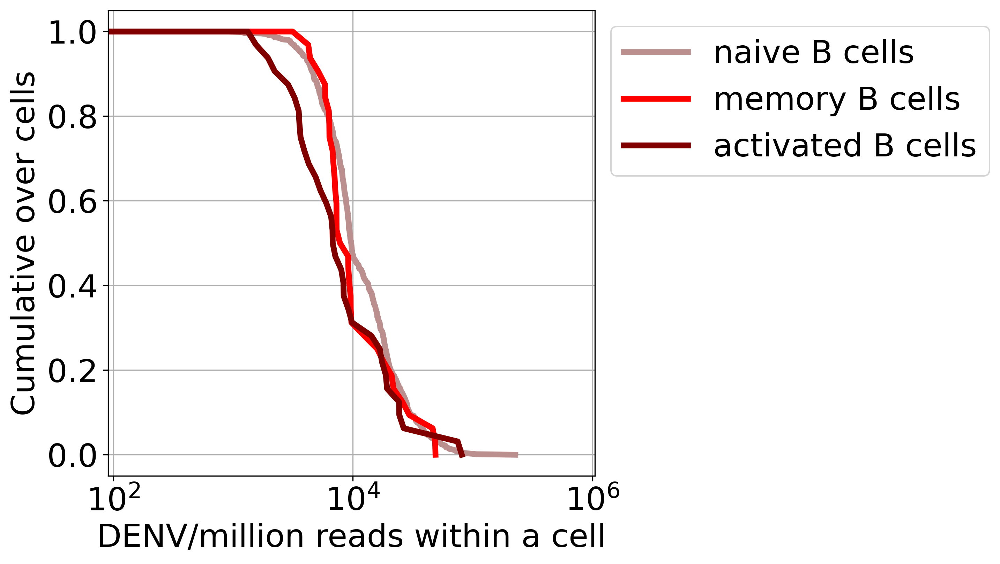

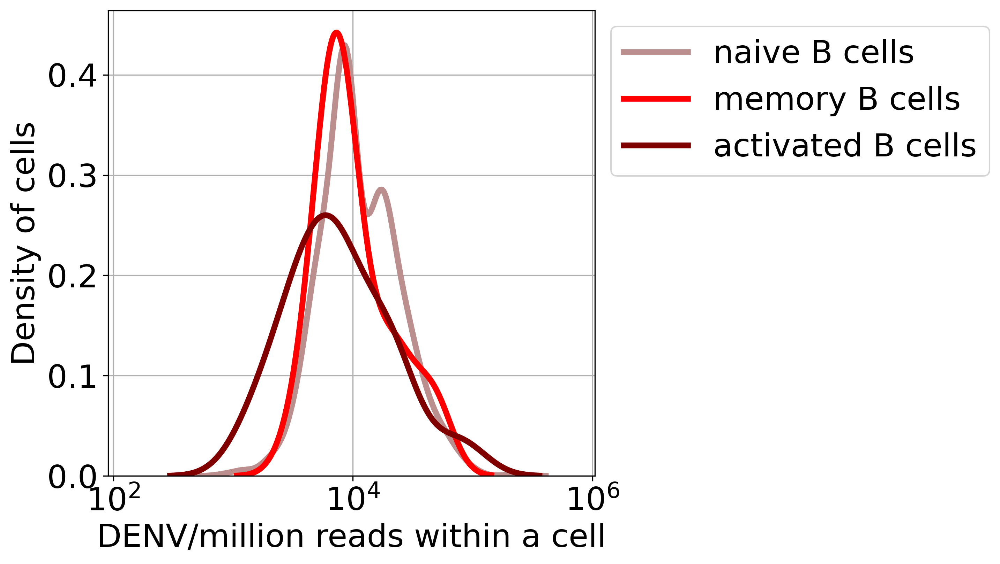

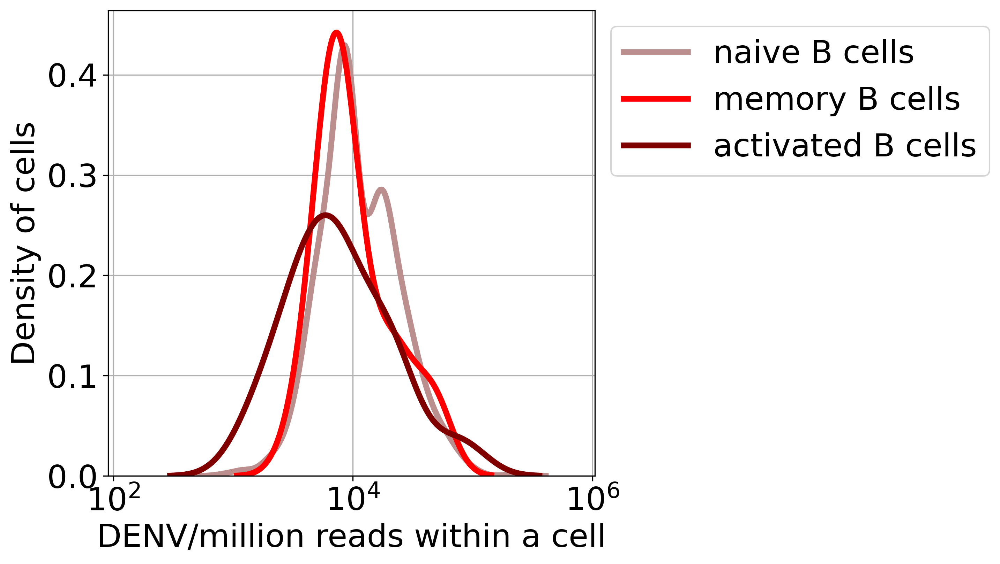

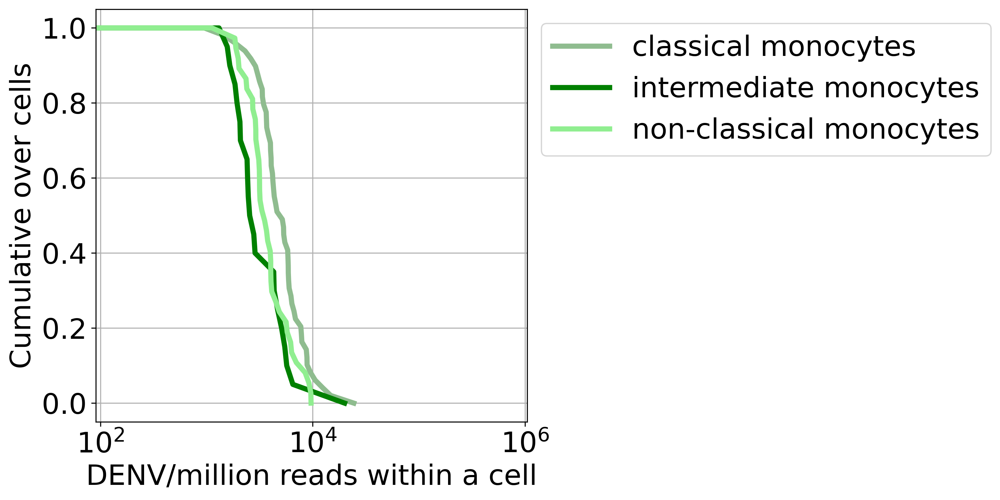

...

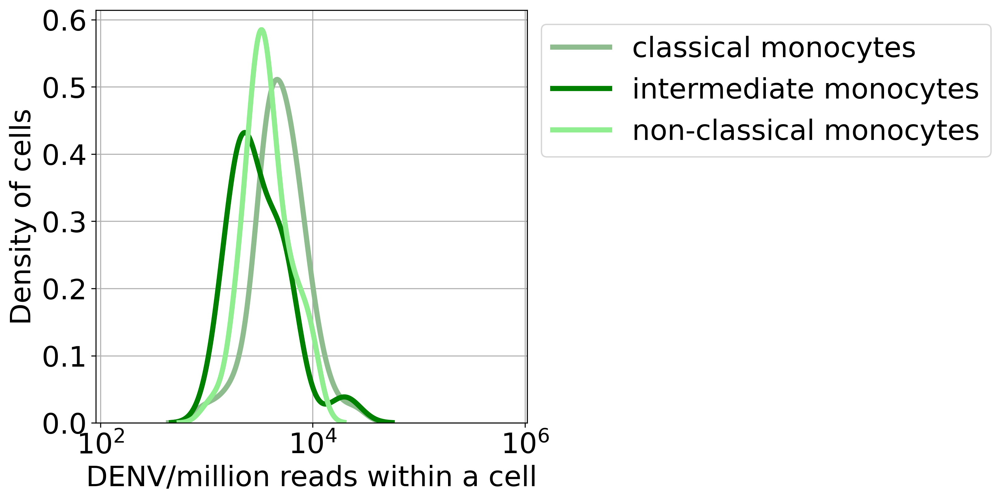

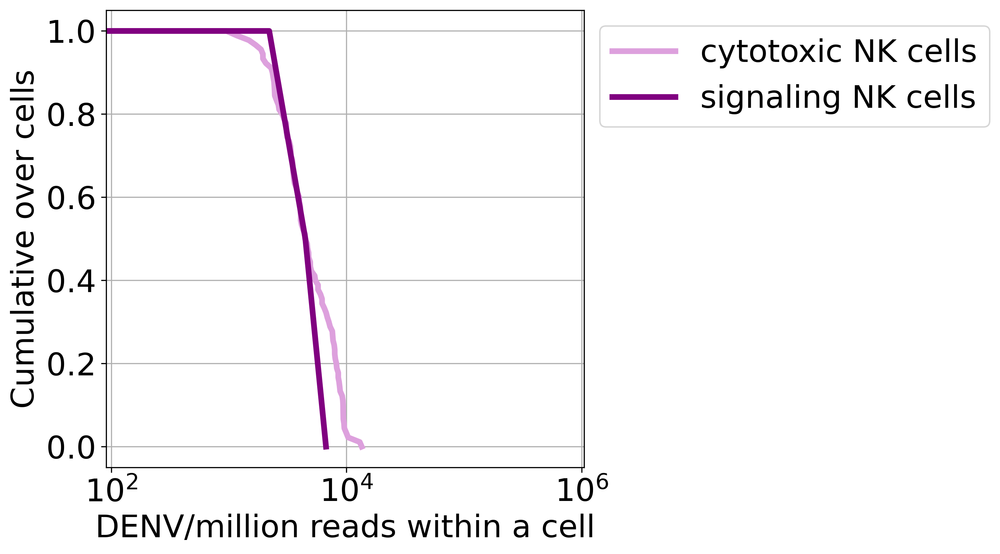

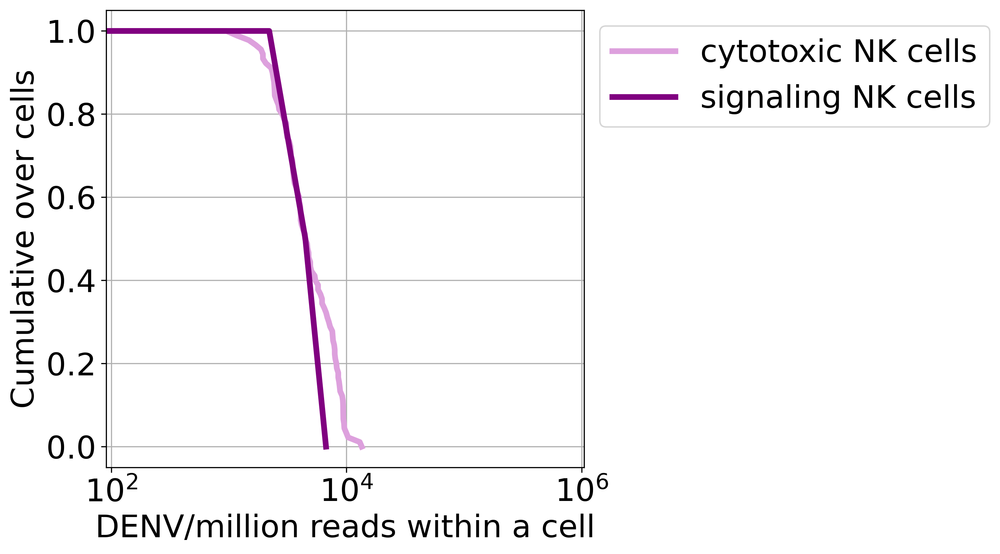

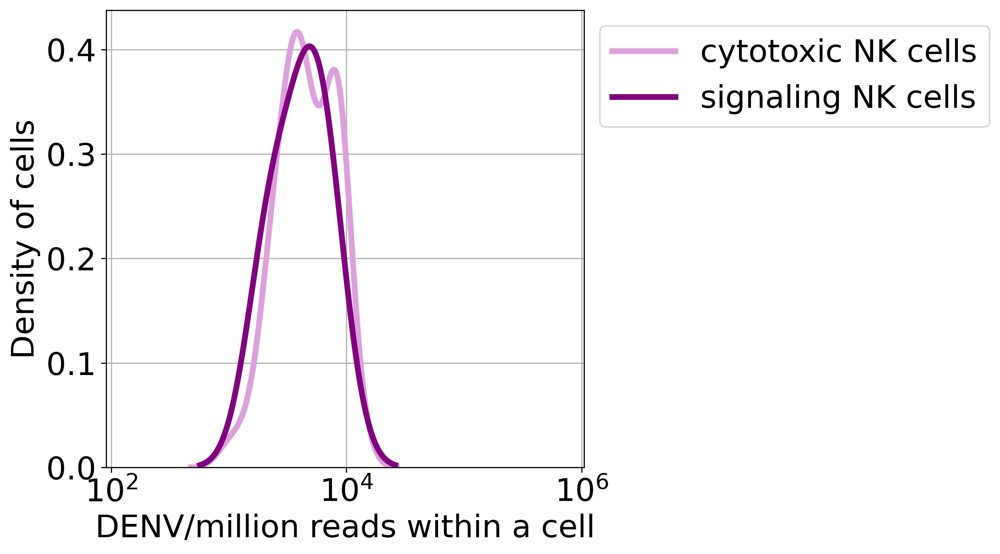

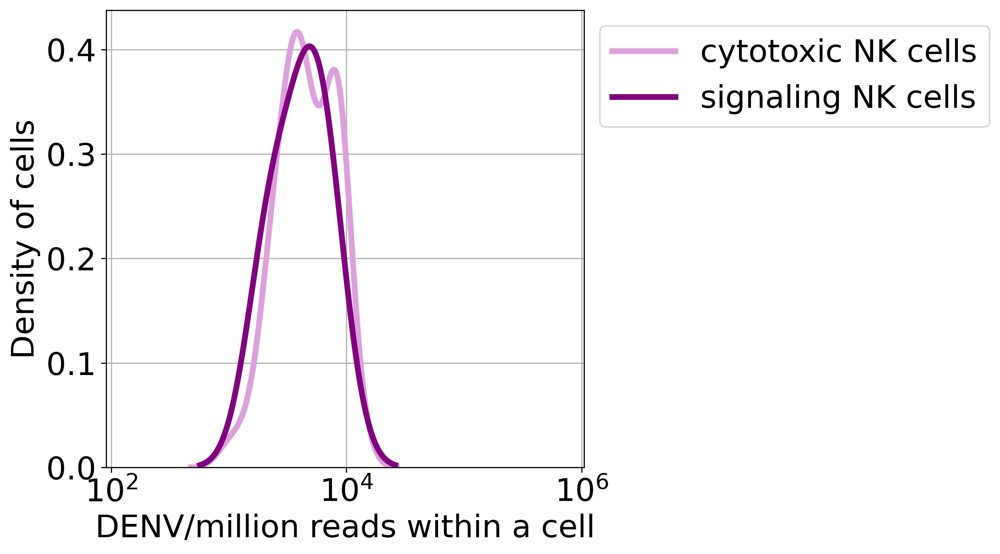

In [140]:
adata_virus = adata_kid[adata_kid.obs['DENV_reads'] != 0]
cts1 = ['naive B cells', 'memory B cells', 'activated B cells',]
virus_cum(cts1, adata_virus, 'cell_subtype_new', save_figures, name='cum_B.pdf')   
virus_cum(cts1, adata_virus, 'cell_subtype_new', save_figures, name='cum_B.png')  

virus_kde(cts1, adata_virus, 'cell_subtype_new', save_figures, name='kde_B.pdf')   
virus_kde(cts1, adata_virus, 'cell_subtype_new', save_figures, name='kde_B.png')   

cts2 = ['classical monocytes', 'intermediate monocytes', 'non-classical monocytes',]
virus_cum(cts2, adata_virus, 'cell_subtype_new', save_figures, name='cum_Mono.pdf')   
virus_cum(cts2, adata_virus, 'cell_subtype_new', save_figures, name='cum_Mono.png')  

virus_kde(cts2, adata_virus, 'cell_subtype_new', save_figures, name='kde_Mono.pdf')   
virus_kde(cts2, adata_virus, 'cell_subtype_new', save_figures, name='kde_Mono.png')   

cts3 = ['cytotoxic NK cells', 'signaling NK cells']
virus_cum(cts3, adata_virus, 'cell_subtype_new', save_figures, name='cum_NK.pdf')   
virus_cum(cts3, adata_virus, 'cell_subtype_new', save_figures, name='cum_NK.png')  

virus_kde(cts3, adata_virus, 'cell_subtype_new', save_figures, name='kde_NK.pdf')   
virus_kde(cts3, adata_virus, 'cell_subtype_new', save_figures, name='kde_NK.png')   

In [12]:
adata_virus = adata_kid[adata_kid.obs['DENV_reads'] != 0]

x_dic = {}
for cell_type in ['naive B cells', 'memory B cells', 'activated B cells',
                 'classical monocytes', 'intermediate monocytes', 'non-classical monocytes',
                  'cytotoxic NK cells', 'signaling NK cells'
                 ]:
        adata_ct = adata_virus[adata_virus.obs['cell_subtype_new'] == cell_type]

        x = list(np.sort(np.log2(adata_ct.obs['DENV_reads'] / adata_ct.obs['n_counts'] * 10e6 + 1)))
        x_dic[cell_type] = x

### B cell subtypes

In [13]:
from scipy.stats import ks_2samp
ks_2samp(x_dic['naive B cells'], x_dic['memory B cells'])
# Bonferroni correcttion: 0.2504385328882879

KstestResult(statistic=0.21763728298150703, pvalue=0.08347951096276263)

In [19]:
ks_2samp(x_dic['memory B cells'], x_dic['activated B cells'])
# Bonferroni correcttion: 0.5187427627828992

KstestResult(statistic=0.2727272727272727, pvalue=0.1729142542609664)

In [20]:
ks_2samp(x_dic['naive B cells'], x_dic['activated B cells'])
# Bonferroni correcttion: 0.024993228412048707

KstestResult(statistic=0.28641137159223506, pvalue=0.008331076137349569)

### monocytes subtypes

In [21]:
ks_2samp(x_dic['classical monocytes'], x_dic['intermediate monocytes'])
# Bonferroni correcttion: 0.0010000805036099172

KstestResult(statistic=0.5190476190476191, pvalue=0.0003333601678699724)

In [22]:
ks_2samp(x_dic['classical monocytes'], x_dic['non-classical monocytes'])
# Bonferroni correcttion: 0.07497968523614612

KstestResult(statistic=0.34421052631578947, pvalue=0.00861966981340297)

In [23]:
ks_2samp(x_dic['non-classical monocytes'], x_dic['intermediate monocytes'])
# Bonferroni correcttion: 0.08335361432075687

KstestResult(statistic=0.38220551378446116, pvalue=0.027784538106918957)

### NK cell subtypes

In [24]:
ks_2samp(x_dic['cytotoxic NK cells'], x_dic['signaling NK cells'])

KstestResult(statistic=0.32967032967032966, pvalue=0.8117782220763332)

### non-classical monocytes vs classical monocytes

In [11]:
def ks_test(adata1, adata2):
    import anndataks
    ks_res = anndataks.compare(adata1, adata2, log1p=True)

    from statsmodels.stats.multitest import multipletests
    adjust_pvalue = multipletests(ks_res['pvalue'], alpha=0.05, method='fdr_bh')
    ks_res['adj_pvalue'] = adjust_pvalue[1]
    
    return ks_res

In [12]:
# all non-classical monocytes vs classical monocytes
if False:
    adata_ncm = adata_kid[adata_kid.obs['cell_subtype_new'] == 'non-classical monocytes']
    adata_cm = adata_kid[adata_kid.obs['cell_subtype_new'] == 'classical monocytes']

    ks_res = ks_test(adata_cm, adata_ncm)
    ks_res[(ks_res['adj_pvalue'] < 0.05) & (ks_res['log2_fold_change'] > 1)].index.tolist()

In [13]:
# SDp non-classical monocytes vs classical monocytes
if False:
    adata_ncm = adata_kid[(adata_kid.obs['cell_subtype_new'] == 'non-classical monocytes') & 
                         (adata_kid.obs['Condition'] == 'S_dengue')]
    adata_cm = adata_kid[(adata_kid.obs['cell_subtype_new'] == 'classical monocytes') & 
                        (adata_kid.obs['Condition'] == 'S_dengue')]

    ks_res = ks_test(adata_cm, adata_ncm)
    # ks_res[(ks_res['adj_pvalue'] < 0.05) & (ks_res['log2_fold_change'] > 1)].index.tolist()
    ks_res[(ks_res['pvalue'] < 0.05) & (ks_res['log2_fold_change'] > 1)].index.tolist()

In [15]:
adata_virus = adata_kid[adata_kid.obs['DENV_reads'] != 0]

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [21]:
adata_virus[adata_virus.obs['cell_subtype_new'] == 'non-classical monocytes'].obs.groupby(['ID', 'Condition']).size()

ID        Condition
5_089_01  DWS           3
          dengue        0
5_154_01  DWS           0
          dengue        2
6_020_01  DWS          15
          dengue        0
6_025_01  DWS          18
          dengue        0
dtype: int64

In [22]:
adata_virus[adata_virus.obs['cell_subtype_new'] == 'classical monocytes'].obs.groupby(['ID', 'Condition']).size()

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


ID        Condition
5_089_01  DWS           2
          dengue        0
5_154_01  DWS           0
          dengue        1
6_020_01  DWS           4
          dengue        0
6_025_01  DWS          43
          dengue        0
dtype: int64

In [24]:
res = {}
for ID in ['6_025_01', '5_089_01', '6_020_01', '5_154_01']:
    temp_ncm = adata_virus[(adata_virus.obs['cell_subtype_new'] == 'non-classical monocytes') &
                    (adata_virus.obs['ID'] == ID)]
    temp_cm = adata_virus[(adata_virus.obs['cell_subtype_new'] == 'classical monocytes') &
                    (adata_virus.obs['ID'] == ID)]
    resi = ks_test(temp_cm, temp_ncm)
    res[ID] = resi

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categor

In [25]:
for ID in res.keys():
    print(ID)
    print(len(res[ID][(res[ID]['adj_pvalue'] < 0.05) & (res[ID]['log2_fold_change'] > 1)].index.tolist()))
    print(len(res[ID][(res[ID]['pvalue'] < 0.05) & (res[ID]['log2_fold_change'] > 1)].index.tolist()))
    print('------------------------------------')

6_025_01
2
50
------------------------------------
5_089_01
0
0
------------------------------------
6_020_01
0
9
------------------------------------
5_154_01
0
0
------------------------------------


In [26]:
ls1 = res['6_025_01'][(res['6_025_01']['pvalue'] < 0.05) & 
                      (res['6_025_01']['log2_fold_change'] > 1)].index.tolist()

ls2 = res['6_020_01'][(res['6_020_01']['pvalue'] < 0.05) & 
                      (res['6_020_01']['log2_fold_change'] > 1)].index.tolist()

In [32]:
set(ls1) & set(ls2)

set()